<!-- In this notebook, a scope for the ArI dataset is generated using the clustering approach introduced by Doyle and co-workers (JACS 2022, 144, 1045-1055). The results are then analyzed. -->

In this notebook, scopes are selected for the ArI datasets using the clustering workflow published by Doyle and co-workers. At the end, we will additionally compare the results to ScopeBO and the clustering algorithm by Glorius and co-workers.

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
from pathlib import Path
import pandas as pd
import numpy as np
from scipy.cluster import hierarchy
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
from rdkit import Chem
from matplotlib.lines import Line2D
from rdkit.Chem import Draw
from rdkit.Chem import AllChem
from sklearn.preprocessing import scale
from matplotlib.patches import Patch
from scipy.spatial.distance import cdist
import numpy as np
from Code.predictor import ScopeBO
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
from Code.benchmark import Benchmark
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import colorsys


# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14, # Legend titles
    "font.family": "Helvetica"   # Font
    })

In [2]:
# function to show the molecular structure of the selected compounds
def generate_representation(smiles_list,common_core="c1ccccc1I"):
    # Convert to molecules
    mol_list = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]

    # Generate 2D coordinates for all mols
    for mol in mol_list:
        AllChem.Compute2DCoords(mol)

    # Define iodobenzene substructure for alignment
    core = Chem.MolFromSmarts(common_core)
    AllChem.Compute2DCoords(core)

    # Align each molecule to the substructure if it matches
    for mol in mol_list:
        if mol.HasSubstructMatch(core):
            AllChem.GenerateDepictionMatching2DStructure(mol, core)

    return mol_list

In [3]:
# define a couple things
objectives = ["rate"]
directory = "."
wdir = Path(directory)
datasets = ["high","medium","low"]

In [4]:
dfs_labelled = {}
dfs_clustering = {}
dfs_umap = {}
for dset in datasets:
    # Load the data (pre-processing was already carried out in the curation of the read-in dataset)
    dfs_labelled[dset] = pd.read_csv(f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv", index_col=0,header=0)
    dfs_clustering[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_clustering[dset] = dfs_clustering[dset].drop(columns='rate')  # drop the objective values

    # Scale the data
    dfs_clustering[dset] = pd.DataFrame(scale(dfs_clustering[dset]),dfs_clustering[dset].index,dfs_clustering[dset].columns)

    # make a UMAP for the dataset
    fit = UMAP(n_neighbors=40,min_dist=0.7,n_components=2,metric="euclidean",random_state=12)
    dfs_umap[dset] = pd.DataFrame(fit.fit_transform(dfs_clustering[dset]),dfs_clustering[dset].index,["UMAP1","UMAP2"])
    if dset == "high":
        print(f"There are {len(dfs_clustering[dset].columns)} dimensions in the dataset.")

There are 31 dimensions in the dataset.


In [5]:
# define the dimensionalities of the reduced representation to study
dims = [31, 25, 20, 15, 10, 5, 2]

# function to calculate silhouette scores
def silhouette_scores_hierarchical(data, n_cls_list):
    """helper function to compute a silhouette score for hierarchical clustering using Ward linkage"""
    z = linkage(data, method='ward')
    result = pd.Series(index=n_cls_list, dtype=float)
    for n_cls in n_cls_list:
        cls = fcluster(z, n_cls, criterion='maxclust')
        result.loc[n_cls] = silhouette_score(data, cls)
    return result

# dictionary to store data at different levels of dimensionality reduction
dfs_dim={}
# dimensionality reduction
for dset in datasets:
    n_neighbors = int(np.sqrt(dfs_clustering[dset].shape[1]))
    dfs = {}
    for dim in dims:
        key = f"umap{dim}"
        dfs[key] = pd.DataFrame(UMAP(n_components=dim, n_neighbors=n_neighbors,
                                      random_state=0).fit_transform(dfs_clustering[dset]),index=dfs_clustering[dset].index)
    dfs_dim[dset] = dfs

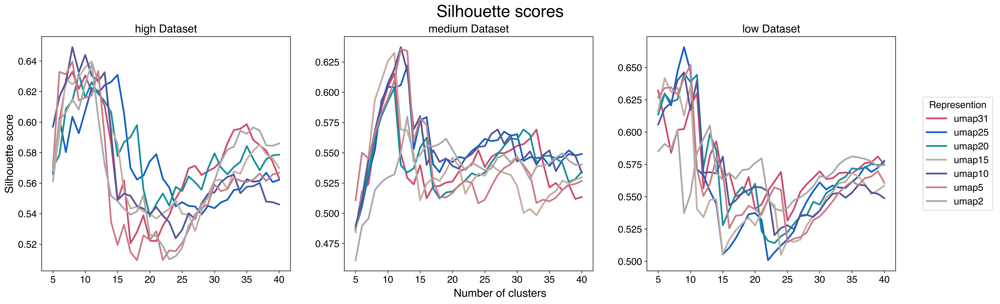

,Representation,Nr_clusters,Silh_score,Representation (min 15 clusters),Nr_clusters (min 15 clusters),Silh_score (min 15 clusters)
high,umap10,8.0,0.649076,umap25,15.0,0.630849
medium,umap10,12.0,0.637248,umap10,15.0,0.580254
low,umap25,9.0,0.665676,umap2,35.0,0.581145


In [6]:
# range of scope sizes to be studied
N_CLS_list = list(range(5,41))
# min number of clusters for the scope
min_clust = 15
all_silh_scores = {}
# df to save the results of the silhouette score analysis
best_silh_scores = pd.DataFrame(np.nan,index=datasets,columns=["Representation","Nr_clusters", "Silh_score",
                                                               f"Representation (min {min_clust} clusters)", 
                                                               f"Nr_clusters (min {min_clust} clusters)",
                                                               f"Silh_score (min {min_clust} clusters)"])

fig,axes = plt.subplots(1,4,figsize=(20,6),gridspec_kw={'width_ratios': [1, 1, 1, 0.3],"wspace": 0.1},
                        constrained_layout=True,dpi=600)
fig.suptitle("Silhouette scores")
fig.supxlabel("Number of clusters",fontsize=16)
for i,dset in enumerate(datasets):
    # populate silhouette scores for all number of clusters and all dimensionality reductions
    silh_scores = pd.DataFrame(index=N_CLS_list)
    all_silh_scores[dset] = silh_scores
    for key, value in dfs_dim[dset].items():
        silh_scores[key] = silhouette_scores_hierarchical(value, N_CLS_list)
    ax = axes[i]
    for j,col in enumerate(silh_scores.columns):
        style = '-' if j <= 6 else '--' if j <= 13 else ':'
        plotting = silh_scores[col][silh_scores[col].notna()]
        axes[i].plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)
    axes[i].set_title(f"{dset} Dataset",fontsize=16)
    if i == 0:
        handles_collected, labels_collected = axes[i].get_legend_handles_labels()
        ax.set_ylabel("Silhouette score")
    else:
        ax.set_ylabel("")
    axes[3].axis('off')
    axes[3].legend(handles=handles_collected, labels=labels_collected, title = "Represention",
                                                        fontsize=14, loc='center')
    
    # record the representation that gives the best silhouette score
    max_position = silh_scores.stack().idxmax()
    best_silh_scores.loc[dset,"Representation"] = max_position[1]
    best_silh_scores.loc[dset,"Nr_clusters"] = int(max_position[0])
    best_silh_scores.loc[dset,"Silh_score"] = silh_scores.max().max()
    silh_scores_pruned = silh_scores.loc[silh_scores.index >= min_clust]
    max_position_pruned = silh_scores_pruned.stack().idxmax()
    best_silh_scores.loc[dset,f"Representation (min {min_clust} clusters)"] = max_position_pruned[1]
    best_silh_scores.loc[dset,f"Nr_clusters (min {min_clust} clusters)"] = int(max_position_pruned[0])
    best_silh_scores.loc[dset,f"Silh_score (min {min_clust} clusters)"] = silh_scores_pruned.max().max()

plt.show()

best_silh_scores

The silhouette score is maximized for a small number of clusters (8–12). We selected to set the smallest number of selected clusters (and therefore the scope size) to 15 which is the number of clusters selected in the original publication.

We used these representations that maximize the silhouette score and contain at least 15 clusters to select the scope.

In [7]:
# do the clustering and assign clusters to each sample
for dset in datasets:
    # Get the  best embedding.
    embedding = best_silh_scores.loc[dset,f"Representation (min {min_clust} clusters)"]
    nr_clusters = best_silh_scores.loc[dset,f"Nr_clusters (min {min_clust} clusters)"]

    # Clustering
    z = hierarchy.linkage(dfs_dim[dset][embedding],method ="ward",metric="euclidean")
    clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")
    
    # Assign to samples
    dfs_clustering[dset]["clusters"] = clusters
    dfs_umap[dset]["clusters"] = clusters

Visualization of the clusters:


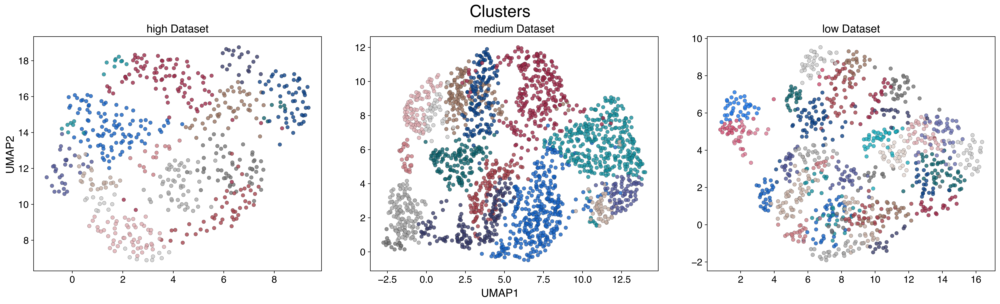

Please note that some of the clusters only differ in the shade due to the large number of clusters.


In [8]:
# draw the clusters
print("Visualization of the clusters:")

# making sure that the colors don't run out
all_colors = all_colors * 4

fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
fig.suptitle("Clusters")
fig.supxlabel("UMAP1",fontsize=16)
for i,dset in enumerate(datasets):
    ax = axes[i]
    for cluster_id in sorted(dfs_umap[dset]['clusters'].unique()):
        color_id = cluster_id-1  # colors are zero-index, but clusters one-indexed
        cluster_data = dfs_umap[dset][dfs_umap[dset]['clusters'] == cluster_id]
        ax.scatter(
            cluster_data['UMAP1'], cluster_data['UMAP2'],
            color=all_colors[cluster_id],
            label=f'Cluster {cluster_id}',
            s=30, alpha=0.8, edgecolor='k', linewidth=0.2
        )
    ax.set_title(f"{dset} Dataset",fontsize=16)
    if i == 0:
        ax.set_ylabel("UMAP2")
    else:
        ax.set_ylabel("")
plt.show()
print("Please note that some of the clusters only differ in the shade due to the large number of clusters.")

In [9]:
# load the normalization bounds
df_bounds = pd.read_csv(f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/bounds.csv",index_col=0)
print("Normalization bounds:")
df_bounds

Normalization bounds:


,high,medium,low
obj_min,0.432225,1.174966,2.154690
obj_max,0.603510,1.984558,2.483439
vendi_min,2.392147,2.166708,2.043167
vendi_max,6.505295,6.313570,5.846067


In [10]:
# define a function to extract the relevant bounds in a format suitable for the Benchmark class
def get_bounds(dset):
    bounds = {}
    # get the metrics for the rate objective
    bounds["rate"] = (df_bounds.loc["obj_max",dset],df_bounds.loc["obj_min",dset])
    # get the metrics for the vendi score
    bounds["vendi"] = (df_bounds.loc["vendi_max",dset],df_bounds.loc["vendi_min",dset])

    return bounds


# function to calculate the scope score
def calculate_scope_score(av_rate,Vendi_score,bounds):
    scaled_rate = (av_rate - bounds["rate"][1])/(bounds["rate"][0] - bounds["rate"][1])
    scaled_Vendi = (Vendi_score - bounds["vendi"][1])/(bounds["vendi"][0] - bounds["vendi"][1])

    return scaled_rate * scaled_Vendi

In [11]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results_silh = pd.DataFrame(np.nan,index=datasets,columns=["Average rate","Vendi score","Scope score"])
dfs_vendi = {}

for dset in datasets:
    cluster_rates = [] # list to save the rates
    dfs_vendi[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_vendi[dset]["rate"] = "PENDING"  # reset the rate data so that only the selected points will have a rate
    for cluster in range(max(dfs_clustering[dset]["clusters"].unique())):  # loop through all clusters
        cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
        df_cluster = dfs_clustering[dset].loc[dfs_clustering[dset]["clusters"]== cluster]  # look at the points in the current cluster
        df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_clustering did not contain the rate data)
        centroid = df_cluster.mean().values  # this is the center of the cluster
        distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
        df_cluster["distances"] = distances
        centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index.item()  # get the center-most point
        rate_clusterpoint = dfs_labelled[dset].at[centermost_point,"rate"]  # get the rate data for the center-most point
        dfs_vendi[dset].loc[centermost_point,"rate"] = "1"  # put a label for the vendi score calculation (value is not important)
        cluster_rates.append(rate_clusterpoint)  # save the point
    av_rate = sum(cluster_rates)/len(cluster_rates)
    scope_results_silh.loc[dset,"Average rate"] = av_rate
    dfs_vendi[dset].to_csv(wdir.joinpath("df_clustering_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
    Vendi_score = ScopeBO().get_vendi_score(objectives=["rate"],directory=".",filename="df_clustering_vendi.csv")  # calculate the vendi score
    scope_results_silh.loc[dset,"Vendi score"] = Vendi_score
    bounds = get_bounds(dset)
    scope_score = calculate_scope_score(av_rate,Vendi_score,bounds)
    scope_results_silh.loc[dset,"Scope score"] = scope_score

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


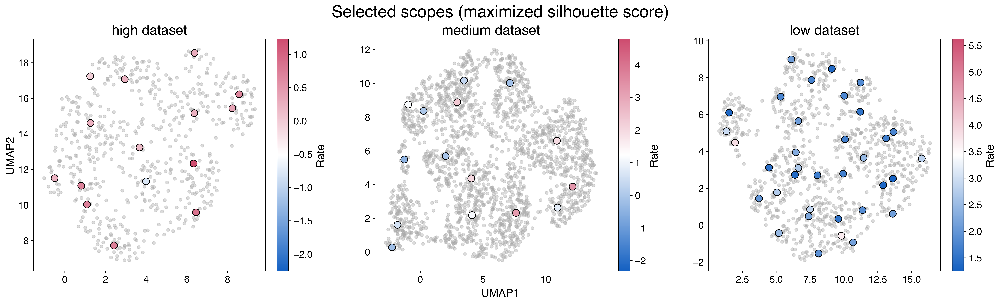

Scope results:


,high,medium,low
Average rate,0.386905,1.066078,2.058240
Vendi score,2.670518,2.232771,2.495366
Scope score,-0.017907,-0.002143,-0.034886


In [12]:
fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
fig.suptitle("Selected scopes (maximized silhouette score)")
fig.supxlabel("UMAP1",fontsize=16)
df_samples_med = None
df_pending_med = None
for i,dset in enumerate(datasets):
    ax = axes[i]
    # only keep the rate label for evaluated points
    dfs_umap[dset]["rate"] = dfs_labelled[dset]["rate"]

    # save the UMAPs with the rate data (but without the clusters)
    dfs_umap[dset].drop(columns="clusters").to_csv(f"./../0_Data/ArI_UMAP_coords_{dset}.csv",index=True,header=True)

    for idx in dfs_vendi[dset].index:
        if dfs_vendi[dset].loc[idx,"rate"] == "PENDING":
            dfs_umap[dset].loc[idx,"rate"] = "PENDING"

    # Separate numeric and non-numeric (e.g., "PENDING") entries
    df_numeric = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['rate'], errors='coerce').notna()].copy()
    df_numeric['rate'] = df_numeric['rate'].astype(float)
    df_pending = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['rate'], errors='coerce').isna()]
    if dset == "medium":
        df_samples_med = df_numeric.copy(deep=True)  # save for the intro figure
        df_pending_med = df_pending.copy(deep=True) # save for the intro figure

    # Define colormap and normalization
    vmin = dfs_labelled[dset]['rate'].min()
    vmax = dfs_labelled[dset]['rate'].max()
    norm = plt.Normalize(vmin, vmax)
    cmap = sns.color_palette("Doyle_cont", as_cmap=True)

    # Plot non-numeric entries ("PENDING")
    ax.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
    ax.set_title(f"{dset} dataset")
    # Plot numeric entries
    scatter_numeric = ax.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["rate"],cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
    # Add colorbar
    cbar = fig.colorbar(scatter_numeric,ax=ax)
    cbar.set_label("Rate")
    if i == 0:
        ax.set_ylabel("UMAP2")
plt.tight_layout()
plt.show()
print("Scope results:")
scope_results_silh.T

In [13]:
print("Normalization bounds for comparison:")
df_bounds

Normalization bounds for comparison:


,high,medium,low
obj_min,0.432225,1.174966,2.154690
obj_max,0.603510,1.984558,2.483439
vendi_min,2.392147,2.166708,2.043167
vendi_max,6.505295,6.313570,5.846067


The scope scores for all clustering scopes are negative because the average rate of the selected samples is below the normalization boounds. This is in part because the clustering selection does not consider the objective performance of the samples in the selection process.

The Vendi scores of the selected samples are also rather low despite a good visual spacing on the UMAP. It is however known that distances on UMAPs, especially between different clusters, can be misleading.

In conclusion, the clustering algorithm yields lower performance than ScopeBO in both average objective and sample diversity.

Scope for high dataset:


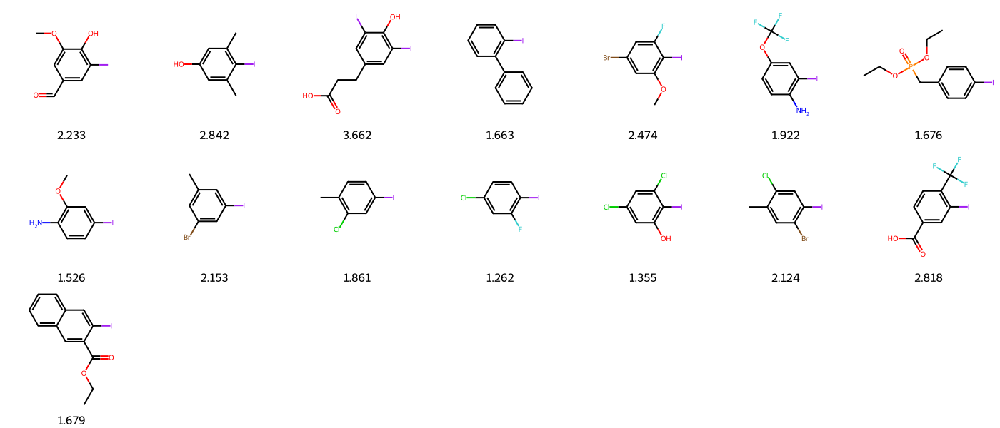



Scope for medium dataset:


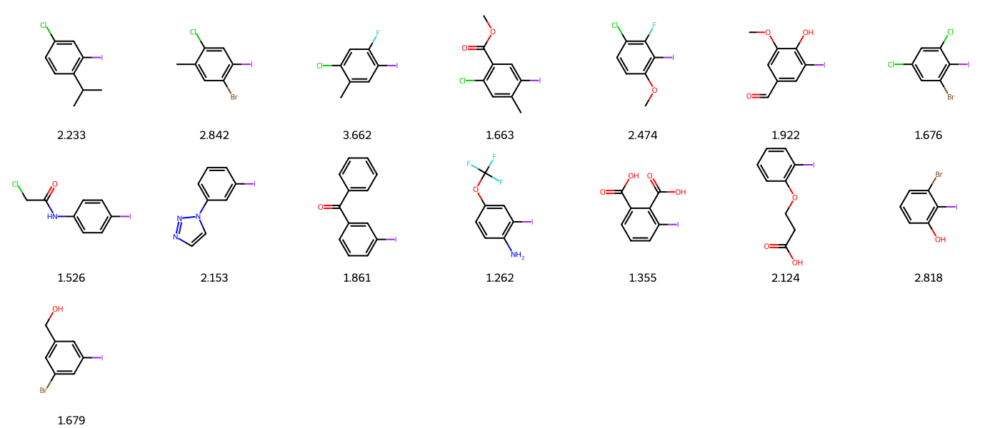



Scope for low dataset:


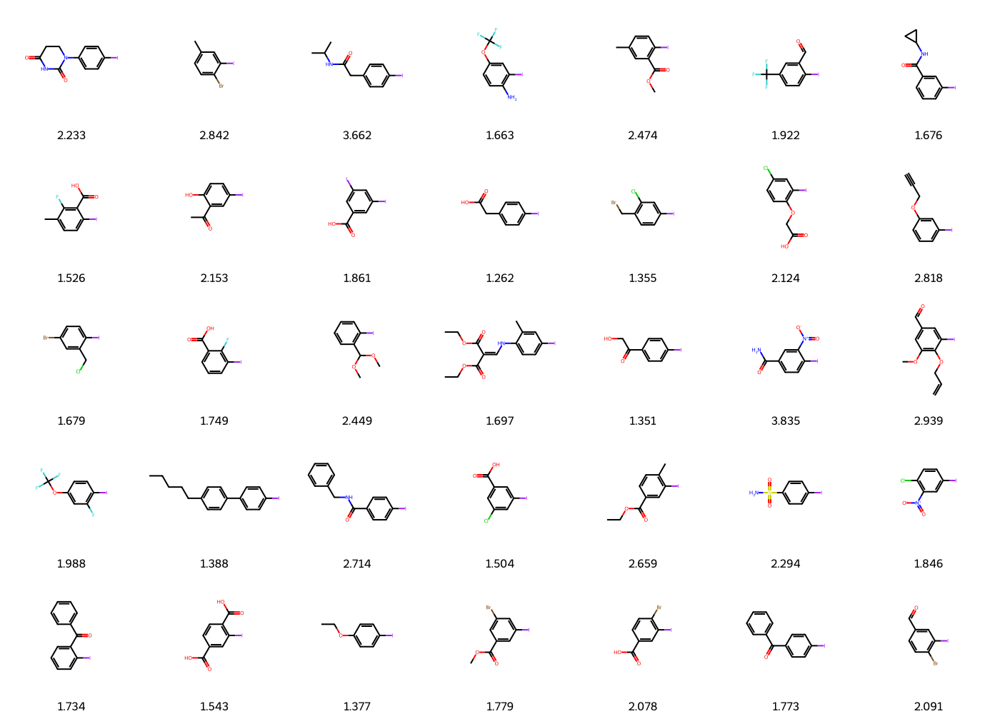

In [14]:
# show the selected molecules
for dset in datasets:
    print(f"Scope for {dset} dataset:")
    mol_list = generate_representation(list(dfs_umap[dset].loc[dfs_umap[dset]["rate"] != "PENDING"].index))
    depiction = Draw.MolsToGridImage(
        mol_list,
        molsPerRow=7,
        subImgSize=(200, 200),
        legends=[str(round(df_numeric.loc[smiles,"rate"],3)) for smiles in df_numeric.sort_values("clusters").index]
        )
    display(depiction)
    if dset != "low":
        print("")
        print("")

The scope size for ScopeBO is 27 samples. We therefore also selected scopes of size 27 for each dataset using the clustering approach.

In [15]:
# figure how the best embedding for a scope of 27 sample
embeddings = {}
for dset in datasets:
    max_value = all_silh_scores[dset].loc[27].max()
    max_embedding = all_silh_scores[dset].loc[27].idxmax()
    embeddings[dset] = max_embedding
    print(f"Best embedding for {dset} dataset: {max_embedding} (silhouette score: {max_value:.3f})")


Best embedding for high dataset: umap31 (silhouette score: 0.571)
Best embedding for medium dataset: umap10 (silhouette score: 0.569)
Best embedding for low dataset: umap31 (silhouette score: 0.554)


In [16]:
# assign the clusters using the selected embeddings
for dset in datasets:
    dfs_clustering27 = {k:v for k,v in dfs_clustering.items()}
    z = hierarchy.linkage(dfs_dim[dset][embeddings[dset]],method ="ward",metric="euclidean")
    clusters = hierarchy.fcluster(z,27,criterion="maxclust")
    dfs_clustering[dset]["clusters"] = clusters

In [17]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results27 = pd.DataFrame(np.nan,index=datasets,columns=["Average rate","Vendi score","Scope score"])
dfs_vendi = {}

for dset in datasets:
    cluster_rates = [] # list to save the rates
    dfs_vendi[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_vendi[dset]["rate"] = "PENDING"  # reset the rate data so that only the selected points will have a rate
    for cluster in range(max(dfs_clustering27[dset]["clusters"].unique())):  # loop through all clusters
        cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
        df_cluster = dfs_clustering27[dset].loc[dfs_clustering27[dset]["clusters"]== cluster]  # look at the points in the current cluster
        df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_clustering did not contain the rate data)
        centroid = df_cluster.mean().values  # this is the center of the cluster
        distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
        df_cluster["distances"] = distances
        centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index.item()  # get the center-most point
        rate_clusterpoint = dfs_labelled[dset].at[centermost_point,"rate"]  # get the rate data for the center-most point
        dfs_vendi[dset].loc[centermost_point,"rate"] = "1"  # put a label for the vendi score calculation (value is not important)
        cluster_rates.append(rate_clusterpoint)  # save the point
    av_rate = sum(cluster_rates)/len(cluster_rates)
    scope_results27.loc[dset,"Average rate"] = av_rate
    dfs_vendi[dset].to_csv(wdir.joinpath("df_clustering_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
    Vendi_score = ScopeBO().get_vendi_score(objectives=["rate"],directory=".",filename="df_clustering_vendi.csv")  # calculate the vendi score
    scope_results27.loc[dset,"Vendi score"] = Vendi_score
    bounds = get_bounds(dset)
    scope_score = calculate_scope_score(av_rate,Vendi_score,bounds)
    scope_results27.loc[dset,"Scope score"] = scope_score

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


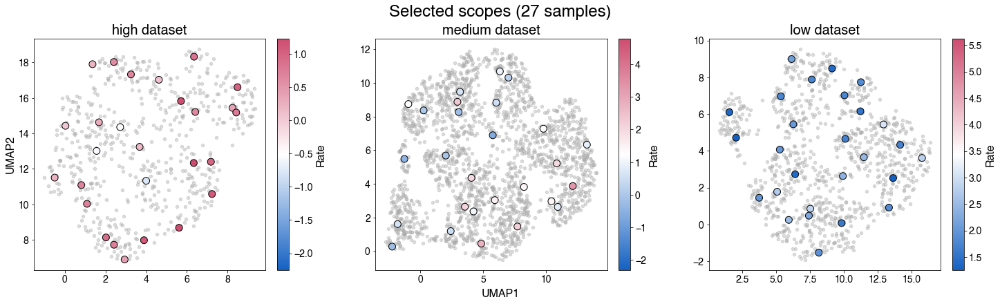

Scope results:


,high,medium,low
Average rate,0.528035,1.037724,1.970800
Vendi score,2.779271,2.502617,2.450169
Scope score,0.052647,-0.013732,-0.059865


In [18]:
fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True)
fig.suptitle("Selected scopes (27 samples)")
fig.supxlabel("UMAP1",fontsize=16)
for i,dset in enumerate(datasets):
    ax = axes[i]
    # only keep the rate label for evaluated points
    dfs_umap[dset]["rate"] = dfs_labelled[dset]["rate"]
    for idx in dfs_vendi[dset].index:
        if dfs_vendi[dset].loc[idx,"rate"] == "PENDING":
            dfs_umap[dset].loc[idx,"rate"] = "PENDING"

    # Separate numeric and non-numeric (e.g., "PENDING") entries
    df_numeric = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['rate'], errors='coerce').notna()].copy()
    df_numeric['rate'] = df_numeric['rate'].astype(float)
    df_pending = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['rate'], errors='coerce').isna()]

    # Define colormap and normalization
    vmin = dfs_labelled[dset]['rate'].min()
    vmax = dfs_labelled[dset]['rate'].max()
    norm = plt.Normalize(vmin, vmax)
    cmap = sns.color_palette("Doyle_cont", as_cmap=True)

    # Plot non-numeric entries ("PENDING")
    ax.scatter(df_pending["UMAP1"], df_pending["UMAP2"], color=all_colors[6], s=20, alpha=0.4, label="PENDING")
    ax.set_title(f"{dset} dataset")
    # Plot numeric entries
    scatter_numeric = ax.scatter(df_numeric["UMAP1"],df_numeric["UMAP2"],c=df_numeric["rate"],cmap=cmap,norm=norm,s=100,alpha=1,edgecolor='k',linewidth=1)
    # Add colorbar
    cbar = fig.colorbar(scatter_numeric,ax=ax)
    cbar.set_label("Rate")
    if i == 0:
        ax.set_ylabel("UMAP2")
plt.tight_layout()
plt.show()
print("Scope results:")
scope_results27.T

In [19]:
print("\nNormalization bounds for comparison:")
df_bounds


Normalization bounds for comparison:


,high,medium,low
obj_min,0.432225,1.174966,2.154690
obj_max,0.603510,1.984558,2.483439
vendi_min,2.392147,2.166708,2.043167
vendi_max,6.505295,6.313570,5.846067


The scope scores are again low due to the low Vendi scores and inferior to the ones obtained by ScopeBO.

Scope for high dataset:


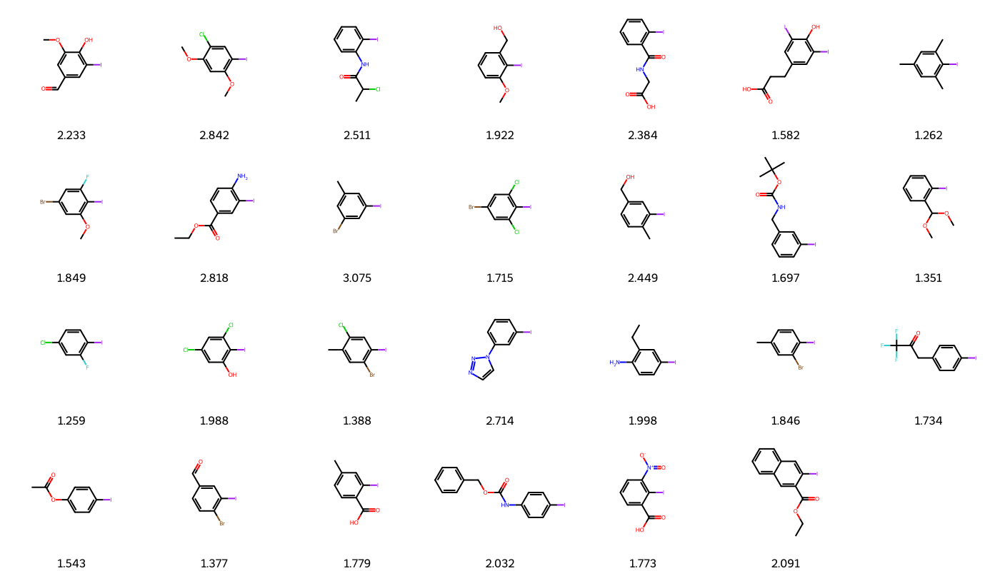



Scope for medium dataset:


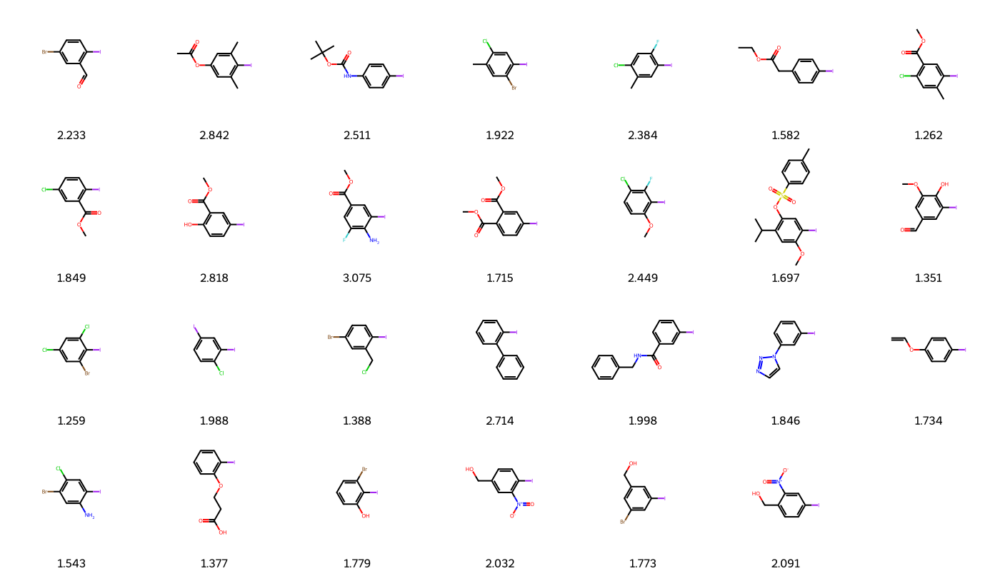



Scope for low dataset:


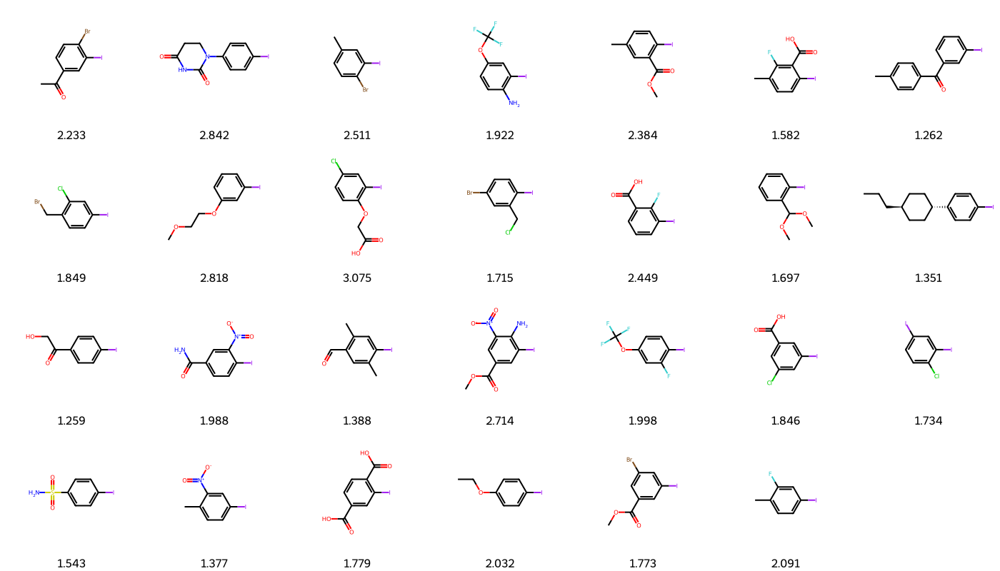

In [20]:
# show the selected molecules
for dset in datasets:
    print(f"Scope for {dset} dataset:")
    mol_list = generate_representation(list(dfs_umap[dset].loc[dfs_umap[dset]["rate"] != "PENDING"].index))
    depiction = Draw.MolsToGridImage(
        mol_list,
        molsPerRow=7,
        subImgSize=(200, 200),
        legends=[str(round(df_numeric.loc[smiles,"rate"],3)) for smiles in df_numeric.sort_values("clusters").index]
        )
    display(depiction)
    if dset != "low":
        print("")
        print("")

### Comparison of the ScopeBO, Doyle clustering, and Glorius clustering results

In [21]:
# get the results for ScopeBO
results_scopebo = pd.DataFrame(np.nan,index=datasets,columns=["Average rate","Vendi score","Scope score"])

for dset in datasets:
    for i,type_results in enumerate(["Objective","Vendi","Scope"]):
        dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                        name_results=f"./../3_Baseline_Comparisons/Results_Data/{dset}_dataset/ei_with-pruning",
                        bounds=get_bounds(dset),show_plot=False)
        results_scopebo.loc[dset,results_scopebo.columns[i]] = dfs_progress["means"].iloc[-1][0]

print("Results with ScopeBO:")
results_scopebo

Results with ScopeBO:


,Average rate,Vendi score,Scope score
high,0.624466,5.070357,0.730313
medium,1.587776,4.736154,0.310601
low,2.326597,4.463113,0.341009


In [22]:
# recreate the same type of dfs for the glorius clustering scopes
# these results were obtained in a different notebook (./Clustering_Glorius_ArI.ipynb) and are copied here

glorius_15clust = pd.DataFrame([[0.422,2.380,0.000],
                                [0.851,2.512,-0.033],
                                [2.350,2.192,0.023]],
                               index=datasets,
                               columns=["Average rate","Vendi score","Scope score"])

glorius_15samp = pd.DataFrame([[0.568,2.681,0.056],
                                [0.895,2.769,-0.050],
                                [2.129,2.177,-0.003]],
                               index=datasets,
                               columns=["Average rate","Vendi score","Scope score"])
glorius_comb = pd.DataFrame([[0.594,3.684,0.297],
                                [1.688,2.847,0.104],
                                [2.441,2.959,0.209]],
                               index=datasets,
                               columns=["Average rate","Vendi score","Scope score"])
glorius_class = pd.DataFrame([[0.508,3.250,0.092],
                                [1.851,2.666,0.100],
                                [2.403,2.480,0.087]],
                               index=datasets,
                               columns=["Average rate","Vendi score","Scope score"])

ScopeBO
        Average rate  Vendi score  Scope score
high        0.624466     5.070357          1.0
medium      1.587776     4.736154          1.0
low         2.326597     4.463113          1.0
Doyle (max. silh. score)
        Average rate  Vendi score  Scope score
high        0.386905     2.670518     0.000000
medium      1.066078     2.232771     0.132716
low         2.058240     2.495366     0.062312
Doyle (27 samples)
        Average rate  Vendi score  Scope score
high        0.528035     2.779271     0.094295
medium      1.037724     2.502617     0.100578
low         1.970800     2.450169     0.000000
Glorius (15 clusters)
        Average rate  Vendi score  Scope score
high           0.422        2.380     0.023933
medium         0.851        2.512     0.047144
low            2.350        2.192     0.206712
Glorius (15 samples)
        Average rate  Vendi score  Scope score
high           0.568        2.681     0.098777
medium         0.895        2.769     0.000000
low         

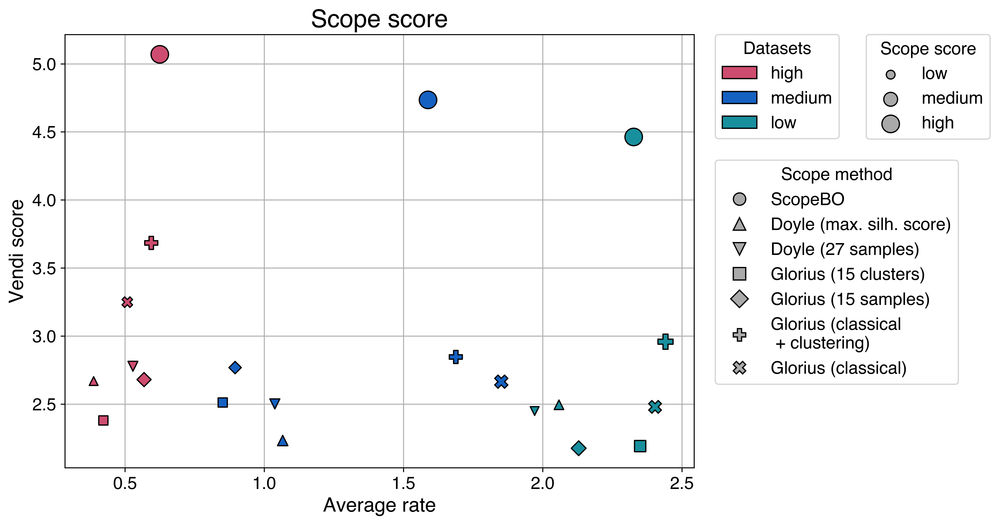

In [23]:
# plot the results

marker_dict = {0:"o",1:"^",2:"v",3:"s",4:"D", 5:"P",6:"X"}
# marker_dict = {0:"o",1:"^",2:"v",3:"s",4:"D", 5:"P"}

dfs_list = [results_scopebo, scope_results_silh, scope_results27, glorius_15clust, glorius_15samp, glorius_comb,glorius_class]
# dfs_list = [results_scopebo, scope_results_silh, scope_results27, glorius_15clust, glorius_15samp, glorius_comb]
size_min, size_max = 50, 200

# Normalize the scope scores for each dataset
for dset in datasets:
    stacked_scope_scores = pd.concat(dfs_list).loc[dset,"Scope score"]
    data_min, data_max= stacked_scope_scores.min(), stacked_scope_scores.max()
    for df in dfs_list:
        df.loc[dset,"Scope score"] = (df.loc[dset,"Scope score"] - data_min)/(data_max - data_min)

label_list = ["ScopeBO",
    "Doyle (max. silh. score)",
    "Doyle (27 samples)",
    "Glorius (15 clusters)",
    "Glorius (15 samples)",
    "Glorius (classical\n + clustering)",
    "Glorius (classical)"
    ]
# label_list = ["ScopeBO",
#     "Doyle (max. silh. score)",
#     "Doyle (27 samples)",
#     "Glorius (15 clusters)",
#     "Glorius (15 samples)",
#     "Glorius (clustering\n + classical)"
#     ]

plt.figure(figsize=(11,6), dpi=600)
plt.title("Scope score")
plt.xlabel('Average rate')
plt.ylabel('Vendi score')
plt.grid(True,zorder=1)
color_map = {dset: all_colors[i] for i, dset in enumerate(datasets)}
alpha_val = 1

for counter, scope_label in enumerate(label_list):

    map_df = dfs_list[counter]
    print(scope_label)
    print(map_df)

    for dset in datasets:
        x = map_df.loc[dset, "Average rate"]
        y = map_df.loc[dset, "Vendi score"]
        raw_size_data = map_df.loc[dset, "Scope score"]
        size = size_min + raw_size_data * (size_max - size_min)
        plt.scatter(
            x, y, s=size, alpha=alpha_val,
            color=color_map[dset],
            edgecolors="k",
            marker=marker_dict[counter], zorder = 2
        )

color_handles = [
    Patch(facecolor=color_map[dset], edgecolor='k', label=dset, alpha=alpha_val)
    for dset in datasets
]

marker_handles = [
    Line2D([0], [0],
           marker=marker_dict[i],
           color='w',
           markerfacecolor=all_colors[6],
           markeredgecolor='k',
           label=label,
           markersize=10)
    for i, label in enumerate(label_list)
]

size_labels = ["low", "medium", "high"]
size_vals = [size_min, (size_min + size_max)/2, size_max]
size_handles = [
    plt.scatter([], [], s=s, color=all_colors[6], alpha=1, edgecolors='k', label=f'{lab}')
    for s, lab in zip(size_vals, size_labels)
]

legend_datasets = plt.legend(
    handles=color_handles,
    title="Datasets",
    loc='upper left',
    bbox_to_anchor=(1.02, 1.02)
)

legend_scores = plt.legend(
    handles=size_handles,
    title="Scope score",
    loc='upper left',
    bbox_to_anchor=(1.26, 1.02)
)

legend_scope = plt.legend(
    handles=marker_handles,
    title="Scope method",
    loc='upper left',
    bbox_to_anchor=(1.02, 0.73)
)

plt.gca().add_artist(legend_datasets)
plt.gca().add_artist(legend_scores)

plt.tight_layout()
plt.show()


<!-- Show the scope -->